In [33]:
import scanpy as sc
import csv
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.4.1 pandas==1.1.0 scikit-learn==0.23.2 statsmodels==0.11.1 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.8.1


In [3]:
combined = sc.read('/scratch/combined_umap_annotated.h5ad')

# Clustering of cells that have TCR data

#### We exclude the cells that do not have TCR data and do the clustering again. 

In [4]:
#non_Tcell_clusters = list(set(cluster for cluster in combined.obs['leiden'] if 'T' not in cluster))

In [5]:
#for cluster in non_Tcell_clusters:
#    Tcells = combined[combined.obs['leiden']!=cluster]

In [6]:
Tcells = combined[combined.obs['has_tcr']=='True']

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [7]:
sc.tl.pca(Tcells, svd_solver='arpack',n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:09)


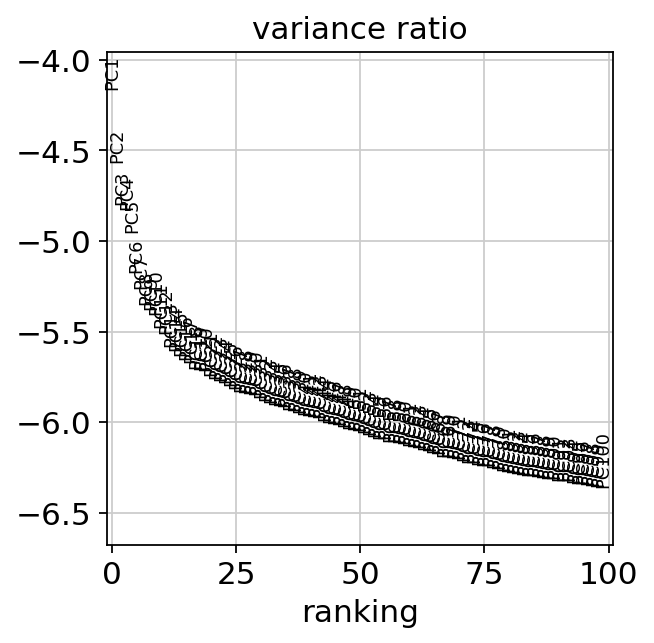

In [8]:
sc.pl.pca_variance_ratio(Tcells, log=True, n_pcs = 100)

In [9]:
# after a lot of testing, choosing 20 principal components with number of neighbers equal to 5 produces the plot with the most
# reasonable details
# The tested parameters are n_pcs=75,50,35,25,20, n_neighbors = 40,30,20,15,10,5
sc.pp.neighbors(Tcells, n_pcs = 20, n_neighbors = 5)
Tcell_clusters = sc.tl.umap(Tcells, n_components=2, copy=True)
# Leiden clustering
sc.tl.leiden(Tcells)
# find marker genes
sc.tl.rank_genes_groups(Tcells, groupby='leiden',method='t-test')

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
running Leiden clustering
    finished: found 57 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)
ranking genes


/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:237: RuntimeWarning: overflow encountered in expm1
  foldchanges = (expm1_func(mean_group) + 1e-9) / (expm1_func(mean_rest) + 1e-9)  # add small value to remove 0's


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


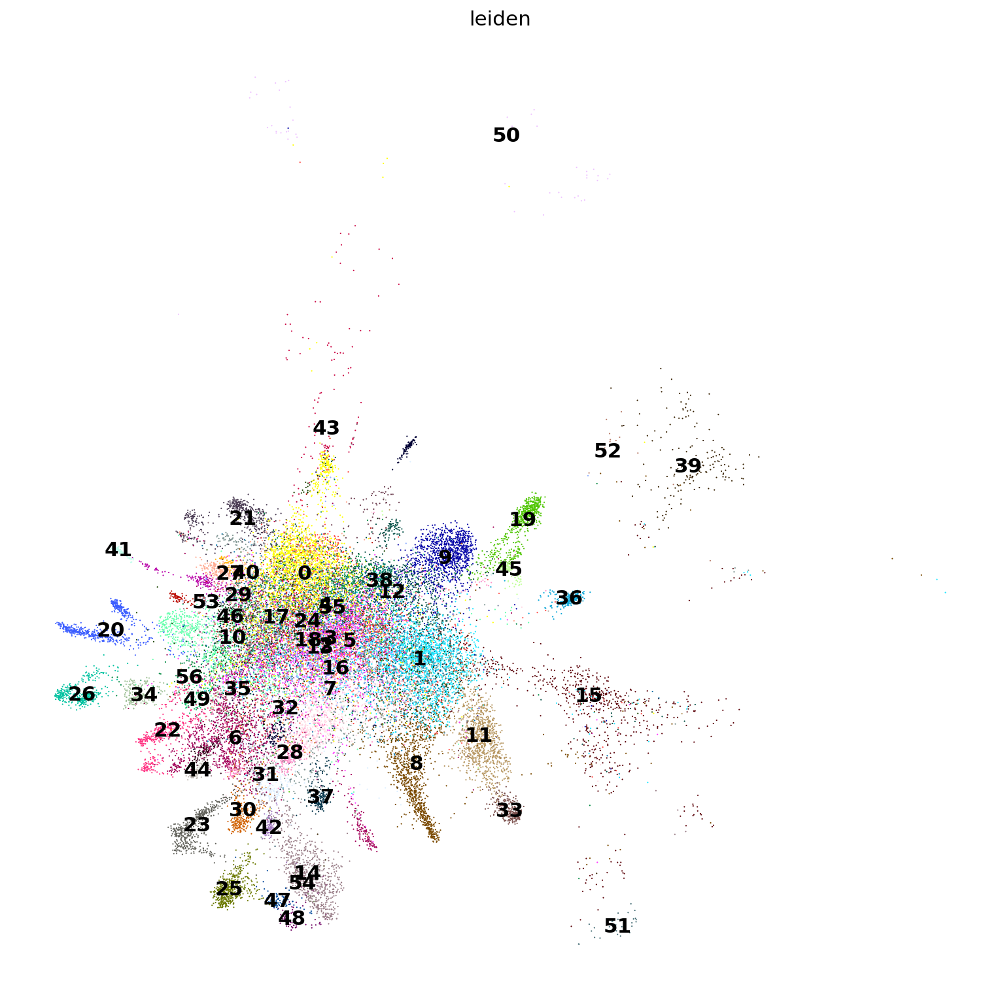

In [10]:
fig, ax = plt.subplots(figsize=(12,12))
sc.pl.umap(Tcells, color='leiden',legend_loc='on data',frameon=False,ax=ax)

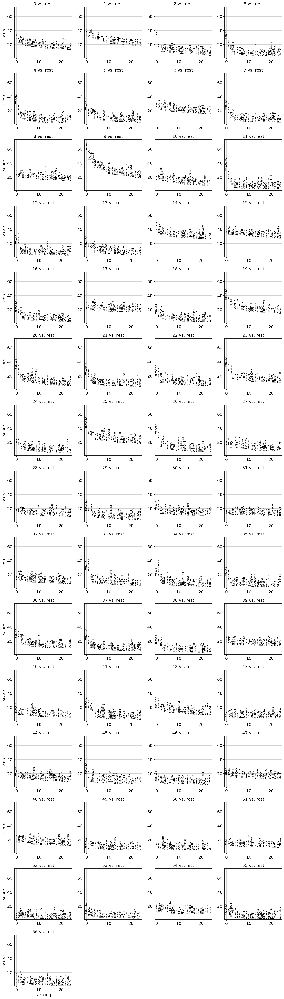

In [11]:
sc.pl.rank_genes_groups(Tcells,n_genes=25)

# Automatic Annotation

In [12]:
# save output for SCSA (an automatic cluster annotation tool)
Tcell_result = Tcells.uns['rank_genes_groups']
Tcell_clusters = Tcell_result['names'].dtype.names
Tcell_cluster_data = pd.DataFrame({cluster + '_' + key[:1]: Tcell_result[key][cluster] for cluster in Tcell_clusters for key in ['names', 'logfoldchanges','scores','pvals']})
Tcell_cluster_data.to_csv("/scratch/Tcell_clusters.csv") 

In [13]:
%%bash

cd /SCSA
python3 SCSA.py -d whole.db -i /scratch/Tcell_clusters.csv -s scanpy -E -f1.5 -p 0.01 -o /scratch/Tcell_annotation_result -m txt 

Version V1.1 [2020/07/03]
DB load: 47347 3 3 48257 37440
Namespace(Gensymbol=True, MarkerDB=None, celltype='normal', cluster='all', db='whole.db', foldchange=1.5, input='/scratch/Tcell_clusters.csv', list_tissue=False, noprint=False, norefdb=False, outfmt='txt', output='/scratch/Tcell_annotation_result', pvalue=0.01, source='scanpy', species='Human', target='cellmarker', tissue='All', weight=100.0)
Version V1.1 [2020/07/03]
DB load: 47347 3 3 48257 37440
load markers: 45409
############################## Cluster 0 ##############################

Cell Num: 87
Gene Num: 29
Not Zero: 166
Cluster 0 Gene number: 31
------------------------------------------------------------
Type                Cell Type           Score     Times
------------------------------------------------------------
?            Hematopoietic stem cell    4.2524    1.3  
------------------------------------------------------------
               (Cancer stem cell)      (3.1743)
---------------------------------------

## Two utility functions

In [14]:
def annotation_abbr(annotations):
    tmp = []
    for ann in annotations:
        ann = ann.replace('Follicular helper (Tfh) T cell','Tfh')
        ann = ann.replace('Cancer stem cell','CSC')
        ann = ann.replace('Natural killer T (NKT) cell','NKT')
        ann = ann.replace('Hematopoietic stem cell','HSC')
        ann = ann.replace('Mesenchymal stem cell','MSC')
        ann = ann.replace('Natural killer cell','NK')
        ann = ann.replace('Embryonic stem cell','ESC')
        ann = ann.replace('Regulatory T (Treg) cell', 'Treg')
        ann = ann.replace(' (Th1)','')
        ann = ann.replace('T helper', 'Th')
        ann = ann.replace(' cell','')
        ann = ann.replace('-','UND')
        tmp.append(ann)
    return tmp

In [15]:
def names_make_unique(annotations):
    ann_dic = {}
    # construct dictionary for all names, cluster indices will be stored for each name
    for i,ann in enumerate(annotations):
        if ann_dic.get(ann)==None:
            ann_dic[ann] = [i]
        else:
            ann_dic[ann].append(i)
    #  
    for ann in ann_dic:
        num = len(ann_dic[ann])
        if num > 1:
            for indx in ann_dic[ann]:
                annotations[indx] = '('+ann+')'+'_'+ str(num)
                num -= 1
    return annotations

## Extract Annotations

In [16]:
Tcell_annotation_output = [['0', '?', 'Hematopoietic stem cell|Cancer stem cell', '4.252359878081274|3.1743023453629235', 1.3396203056376137],
['1', '?', 'Natural killer T (NKT) cell|T helper cell', '4.469832722242791|3.7230309142753364', 1.2005897413056574],
['10', '?', 'Natural killer cell|Natural killer T (NKT) cell', '5.518593670653376|4.609041147848591', 1.1973409422107992],
['11', '?', 'Gonadal mitotic phase fetal germ cell|Leydig precursor cell', '0.9128709291752771|0.9128709291752771', 1.0],
['12', '?', 'Basal cell|Gonadal mitotic phase fetal germ cell', '0.6448790903461512|0.6448790903461512', 1.0],
['13', 'Good', 'Microglial cell', 3.761661721254787, 4.405344361992383],
['14', 'Good', 'Natural killer T (NKT) cell', 5.439293656036458, 3.3633559388388243],
['15', 'Good', 'Natural killer T (NKT) cell', 6.507567367702321, 2.3379508108282216],
['16', '?', 'Natural killer T (NKT) cell|Induced regulatory T (Treg) cell', '2.5476401410509966|2.062781344818462', 1.2350509895052426],
['17', '?', 'Natural killer T (NKT) cell|T cell', '6.49711443185423|5.23875482100572', 1.240202043012758],
['18', '?', 'Hematopoietic stem cell|Cancer stem cell', '3.247287152390151|2.3404133064895065', 1.3874844854906874],
['19', '?', 'T cell|Follicular helper (Tfh) T cell', '6.002738495562807|5.13238788230567', 1.1695800538103798],
['2', 'Good', 'Microglial cell', 2.8827691034006695, 5.947299099870781],
['20', 'Good', 'Natural killer cell', 6.272260474128102, 4.316372842919784],
['21', 'Good', 'Microglial cell', 5.614959616241369, 11.897158999575227],
['22', '?', 'Follicular helper (Tfh) T cell|Natural killer cell', '4.750887228243417|3.1771002423889865', 1.4953532673778773],
['23', '?', 'T cell|Natural killer cell', '5.5690439858737255|5.198579925753539', 1.0712625496599415],
['24', 'Good', 'Microglial cell', 5.57737395693533, 3.4823859070585645],
['25', '?', 'Natural killer T (NKT) cell|Natural killer cell', '6.253275235565993|4.204153284500958', 1.4874041958982165],
['26', 'Good', 'Natural killer cell', 6.770867992982191, 3.6758016540205705],
['27', '?', 'Natural killer T (NKT) cell|Natural killer cell', '6.639605293132997|4.806288539218684', 1.3814412594988188],
['28', '?', 'Follicular helper (Tfh) T cell|T cell', '6.06260834842527|5.706424660583676', 1.062418012858714],
['29', '?', 'Natural killer cell|Natural killer T (NKT) cell', '3.321102654047221|1.909318979139237', 1.739417399781176],
['3', '?', 'Microglial cell|Hematopoietic stem cell', '3.489452800874978|1.9749686111480715', 1.7668396252872696],
['30', '?', 'Natural killer cell|Natural killer T (NKT) cell', '5.77473843614647|4.698099862925044', 1.2291646845818873],
['31', '?', 'T cell|Natural killer T (NKT) cell', '6.607650223782211|4.581311529990658', 1.4423053705312385],
['32', '?', 'Follicular helper (Tfh) T cell|Natural killer cell', '5.24682329801266|3.982070456569797', 1.3176118693119097],
['33', '?', 'Mesenchymal stem cell|Endothelial cell', '3.3470439100041687|3.295924368578333', 1.0155099255047182],
['34', 'Good', 'Follicular helper (Tfh) T cell', 4.075705866566272, 3.1467791396944675],
['35', 'Good', 'Natural killer cell', 3.648533602334762, 7.317585093120495],
['36', '?', 'Follicular helper (Tfh) T cell|T cell', '5.742809744901363|5.609442719003747', 1.023775450178998],
['37', '?', 'Natural killer cell|Natural killer T (NKT) cell', '4.353915996117042|4.311222376496959', 1.009902903606372],
['38', '?', 'Microglial cell|Hematopoietic stem cell', '4.695281473968191|2.55347169942535', 1.8387834394345737],
['39', 'Good', 'B cell', 8.086233705009857, 2.6009002442721125],
['4', '?', 'CD8+ T cell|Natural killer T (NKT) cell', 'nan|nan', 'nan'],
['40', '?', 'Microglial cell|T helper1 (Th1) cell', '6.77569092343441|3.9372864588783085', 1.7209037224496824],
['41', '?', 'Natural killer cell|T helper1 (Th1) cell', '3.8937386703202232|2.0462771749629676', 1.902840298451108],
['42', '?', 'T cell|Natural killer T (NKT) cell', '5.752654800184071|5.5064758971973005', 1.0447071607290737],
['43', 'Good', 'Basal cell', 8.444860973184458, 2.3853586095885513],
['44', '?', 'Natural killer T (NKT) cell|T cell', '6.499392180557064|4.422669841611372', 1.4695630497683843],
['45', '?', 'Follicular helper (Tfh) T cell|T cell', '5.643208250495427|5.141344484375393', 1.097613332007844],
['46', 'Good', 'Natural killer T (NKT) cell', 6.561173980115518, 2.19116260002973],
['47', '?', 'Natural killer T (NKT) cell|B cell', '4.719607858962828|4.03798792751442', 1.168801874518723],
['48', '?', 'Natural killer T (NKT) cell|B cell', '4.889452976313523|4.709866009267661', 1.0381299524641436],
['49', '?', 'Natural killer T (NKT) cell|T cell', '5.803320939741534|4.809323554460418', 1.2066813293023777],
['5', '?', 'Natural killer T (NKT) cell|T cell', '2.4888633148135186|2.306298925522598', 1.0791590314987256],
['50', '?', 'Mesenchymal stem cell|Basophil', '4.944743077679563|4.210589790814922', 1.1743587771162465],
['51', '?', 'Natural killer T (NKT) cell|Astrocyte', '4.269991270751074|3.8674102197716653', 1.1040957716151398],
['52', 'Good', 'Macrophage', 4.338537811343583, 2.36705417306444],
['53', 'Good', 'Natural killer cell', 6.041150377163687, 2.5264024186046616],
['54', 'Good', 'Natural killer T (NKT) cell', 6.088774236906681, 2.0423826850401077],
['55', '?', 'Natural killer T (NKT) cell|CD8+ T cell', '1.313973293906028|0.672112115635459', 1.95499123336545],
['56', 'Good', 'Natural killer T (NKT) cell', 3.629208516849644, '-'],
['6', '?', 'Natural killer cell|T cell', '6.001387825175399|4.7888325670093135', 1.2532047719770962],
['7', 'Good', 'Microglial cell', 4.471567871268471, 4.021598766776134],
['8', '?', 'Regulatory T (Treg) cell|T cell', '8.391354549209586|4.549432119619793', 1.8444839550459922],
['9', '?', 'Microglial cell|T helper1 (Th1) cell', '4.583473498053062|4.260742114695379', 1.0757453454515766]]

In [17]:
# extract annotations
Tcell_cluster_names = [None for _ in range(len(Tcell_annotation_output))]
for annotation in Tcell_annotation_output:
    index = int(annotation[0])
    name = annotation[2]
    Tcell_cluster_names[index] = name
 
Tcell_cluster_names = annotation_abbr(Tcell_cluster_names)
Tcell_cluster_names = names_make_unique(Tcell_cluster_names)

In [18]:
for i,name in enumerate(Tcell_cluster_names):
    print((i,name))

(0, '(HSC|CSC)_2')
(1, 'NKT|Th')
(2, '(Microglial)_5')
(3, '(Microglial|HSC)_2')
(4, 'CD8+ T|NKT')
(5, '(NKT|T)_4')
(6, 'NK|T')
(7, '(Microglial)_4')
(8, 'Treg|T')
(9, '(Microglial|Th1)_2')
(10, '(NK|NKT)_4')
(11, 'Gonadal mitotic phase fetal germ|Leydig precursor')
(12, 'Basal|Gonadal mitotic phase fetal germ')
(13, '(Microglial)_3')
(14, '(NKT)_5')
(15, '(NKT)_4')
(16, 'NKT|Induced regulatory T (Treg)')
(17, '(NKT|T)_3')
(18, '(HSC|CSC)_1')
(19, 'T|Tfh')
(20, '(NK)_4')
(21, '(Microglial)_2')
(22, '(Tfh|NK)_2')
(23, 'T|NK')
(24, '(Microglial)_1')
(25, '(NKT|NK)_2')
(26, '(NK)_3')
(27, '(NKT|NK)_1')
(28, '(Tfh|T)_3')
(29, '(NK|NKT)_3')
(30, '(NK|NKT)_2')
(31, '(T|NKT)_2')
(32, '(Tfh|NK)_1')
(33, 'MSC|Endothelial')
(34, 'Tfh')
(35, '(NK)_2')
(36, '(Tfh|T)_2')
(37, '(NK|NKT)_1')
(38, '(Microglial|HSC)_1')
(39, 'B')
(40, '(Microglial|Th1)_1')
(41, 'NK|Th1')
(42, '(T|NKT)_1')
(43, 'Basal')
(44, '(NKT|T)_2')
(45, '(Tfh|T)_1')
(46, '(NKT)_3')
(47, '(NKT|B)_2')
(48, '(NKT|B)_1')
(49, '(NKT|T)

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


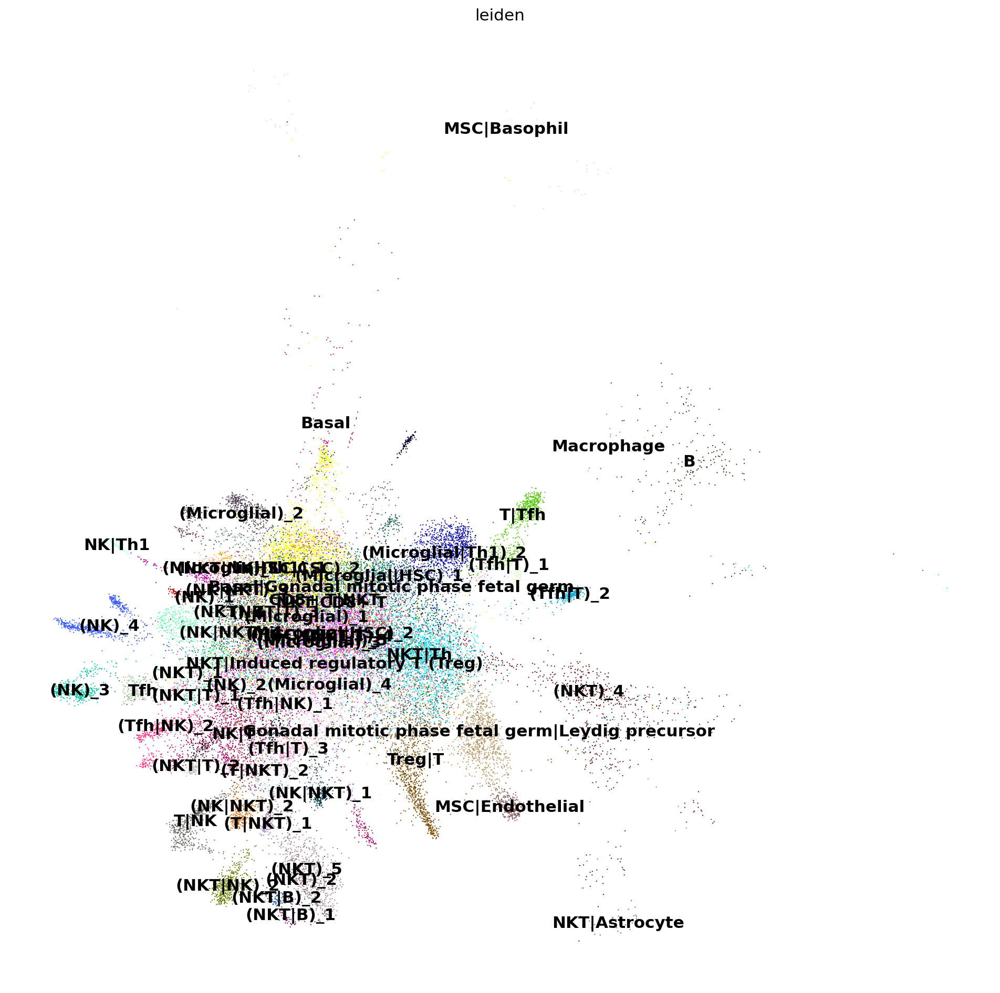

In [19]:
Tcells.rename_categories('leiden', Tcell_cluster_names)
fig, ax = plt.subplots(figsize=(15,15))
sc.pl.umap(Tcells, color='leiden',legend_loc='on data',frameon=False,ax=ax)

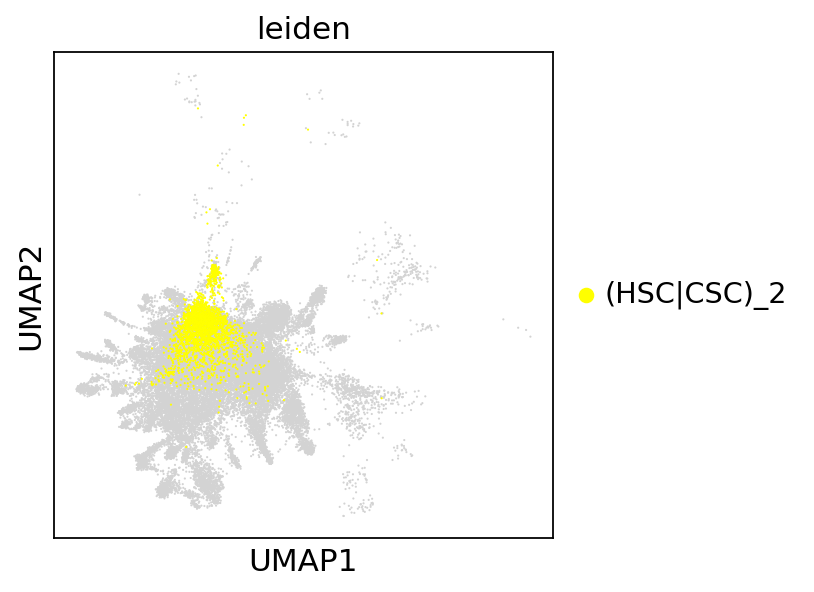

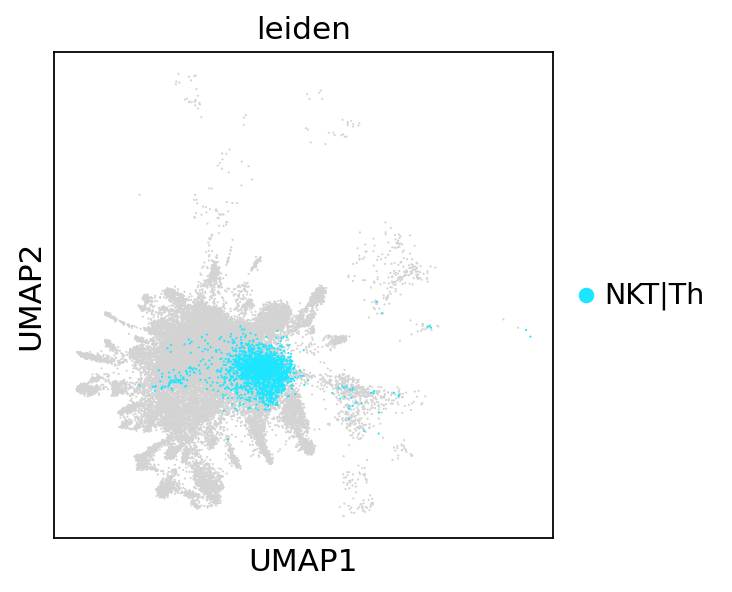

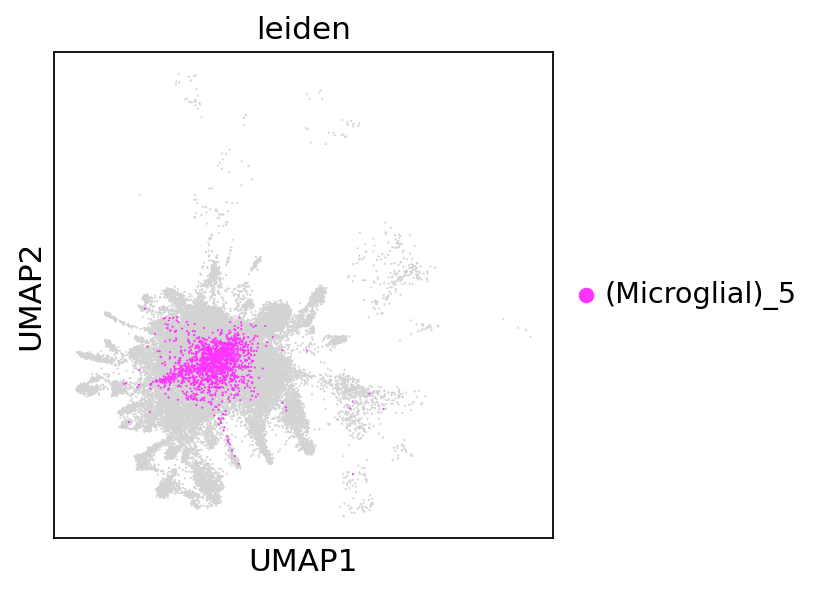

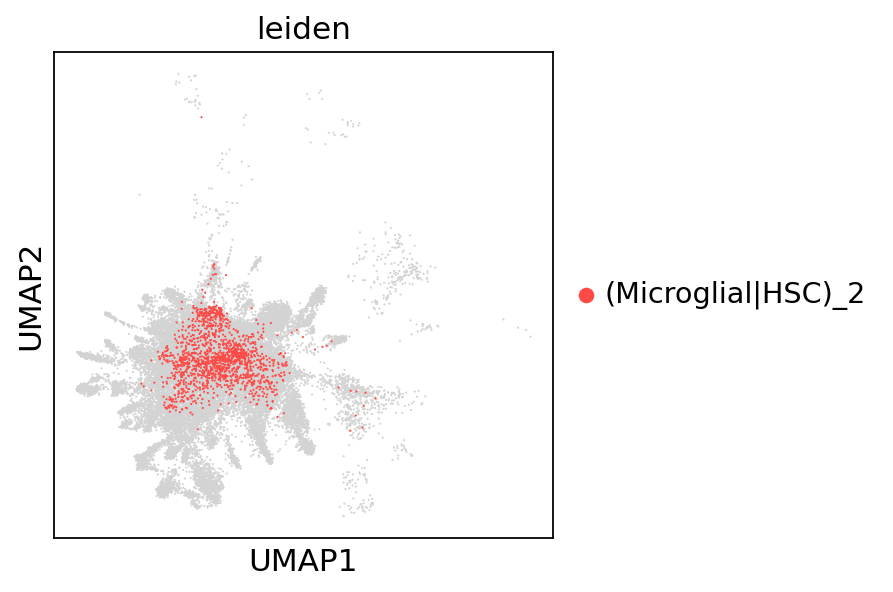

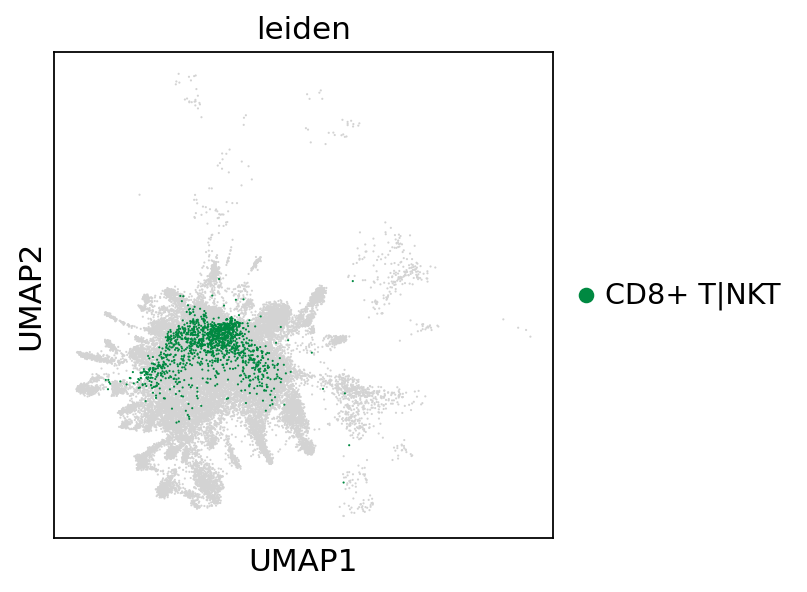

...

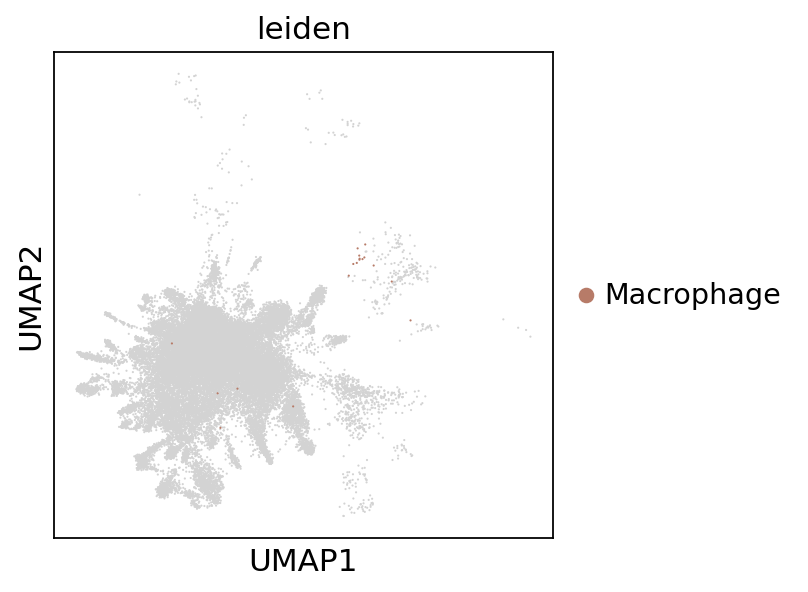

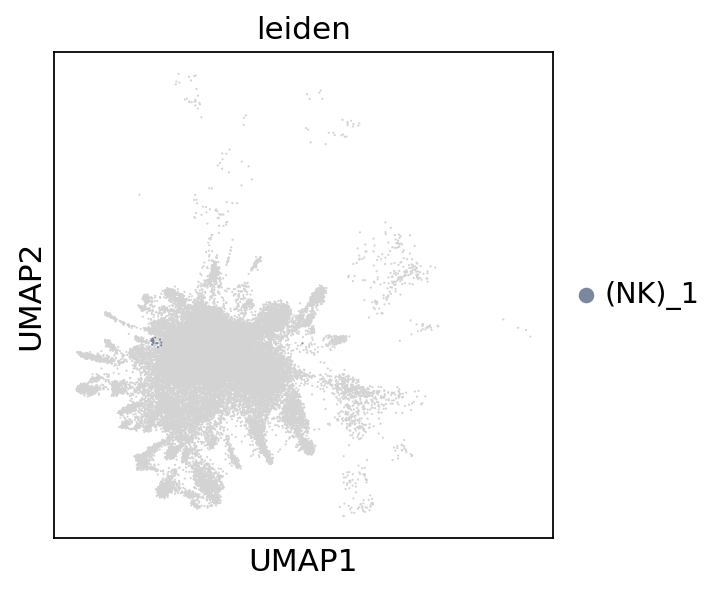

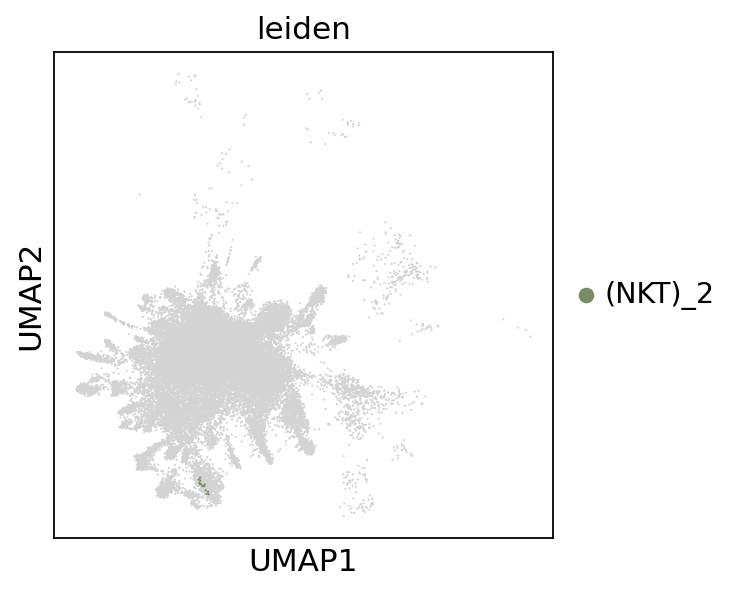

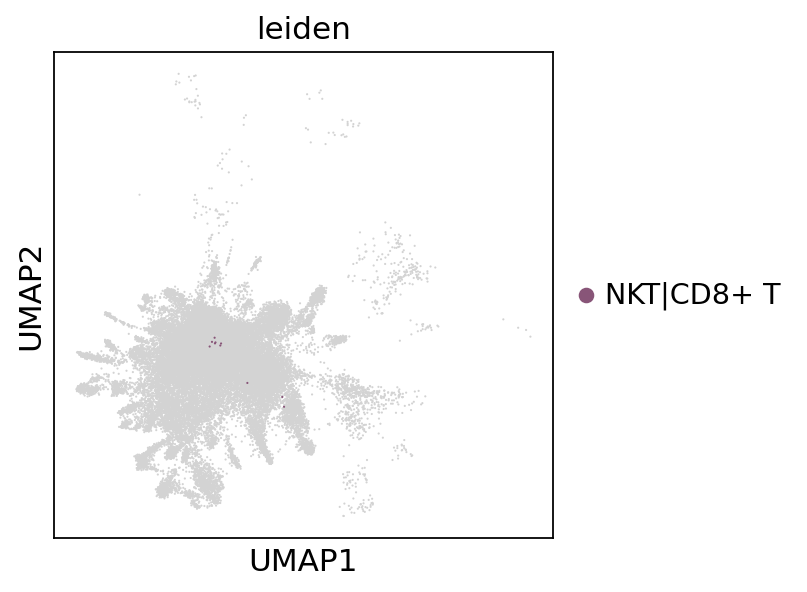

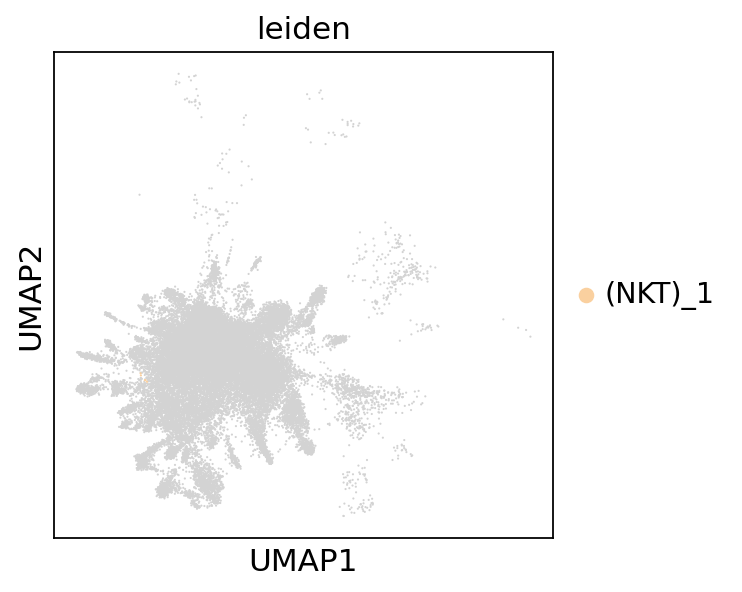

In [20]:
for cluster in Tcell_cluster_names:
    sc.pl.umap(Tcells,color='leiden',groups=[cluster])

In [21]:
save_file = '/scratch/Tcell_clusters_annotated.h5ad'
Tcells.write_h5ad(save_file)

## Export Cluster Marker Genes to a CSV files


In [35]:
cluster_marker_gene_file = '/scratch/Tcells_cluster_genes.csv'

for i in range(len(Tcell_cluster_names)):
    with open(cluster_marker_gene_file, 'a') as file:
        file_writer = csv.writer(file)
        file_writer.writerow('Cluster '+str(i)+':'+Tcell_cluster_names[i])
        file_writer.writerow('\n')
        file_writer.writerow(Tcells.uns['rank_genes_groups']['names'][0])